In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statistics as stat
import time
from Bio.Seq import Seq

In [2]:
import gpcr_package as gpcr


>>>>>>>>>>>>>>>>> Testing dependencies...
`gpcr_package` depends on the following packages:
['ProgressBar', 'Seq', 'SeqIO', 'ceil', 'clr', 'datetime', 'floor', 'go', 'it', 'kurtosis', 'norm', 'np', 'os', 'pd', 'pickle', 'plt', 'skew', 'stat', 'style']
<<<<<<<<<<<<<<<<< Dependencies test successful!


>>>>>>>>>>>>>>>>> Testing constants...
`gpcr_package` uses the following constants:
['AA', 'AA_ABBREVATIONS', 'AA_ABBRE_LONG_NAMES', 'AA_ABBRE_SHORT_NAMES', 'AA_HYDRO_PHOBICITY_PH2', 'AA_HYDRO_PHOBICITY_PH7', 'AA_LONG_NAMES', 'AA_SHORT_NAMES', 'BINS_PLOT_HIST', 'COLOR_COLORBAR_CMAP', 'COLOR_COLORBAR_CMAP_RED_BLUE', 'COLOR_CONFI_LINE', 'COLOR_FIT_GAUSSIAN', 'COLOR_GPCR_CLASSES', 'COLOR_GPCR_CLASSES_ALL', 'COLOR_MEAN_LINE', 'COLOR_MEDIAN_LINE', 'COLOR_PLOT_HIST_DEFAULT', 'COLOR_PLOT_LINE', 'COLOR_PLOT_SCATTER', 'COLOR_QUANTILE_LINE', 'COLOR_STD_ERR_LINE', 'COLOR_ST_LT', 'FIGSIZE_BOX', 'FIGSIZE_DEFAULT', 'FIGSIZE_HEATMAP', 'FIGSIZE_HIST', 'FIGSIZE_HIST_DEFAULT', 'FIGSIZE_LINE', 'FIGSIZE_SCAT

In [7]:
len( gpcr.DISPROT_DF )

2894

In [9]:
len( gpcr.DISPROT_DF.drop_duplicates(subset='seq') )

1207

In [11]:
gpcr.DISPROT_DF.drop_duplicates(subset='seq')

,seq,id,name,description,dbxrefs,annotations,per_letter_annotations,features,seq_len
0,LLGDFFRKSKEKIGKEFKRIVQRIKDFLRNLVPRTES,disprot|DP00004r001,DisProt,disprot|DP00004r001 pos=134-170 term=IDPO:0007...,,,,,37
2,MPKRGKKGAVAEDGDELRTEPEAKKSKTAAKKNDKEAAGE,disprot|DP00007r005,DisProt,disprot|DP00007r005 pos=1-40 term=IDPO:00076 e...,,,,,40
3,MPKRGKKGAVAEDGDELRTEPEAKKSKTAAKKNDKEAAGEGP,disprot|DP00007r002,DisProt,disprot|DP00007r002 pos=1-42 term=IDPO:00076 e...,,,,,42
5,LPEETMDFMVQHTSFKEMKKNPMTNYTTVPQELMDHSISPFMRKGM,disprot|DP00011r006,DisProt,disprot|DP00011r006 pos=215-260 term=IDPO:0007...,,,,,46
7,QGGDLEKCNRAPIY,disprot|DP00011r004,DisProt,disprot|DP00011r004 pos=63-76 term=IDPO:00076 ...,,,,,14
...,...,...,...,...,...,...,...,...,...
2887,NIHGIRTGLFT,disprot|DP02976r004,DisProt,disprot|DP02976r004 pos=394-404 term=IDPO:0007...,,,,,11
2890,NSTILHPNGGTEQGARGSMPAYSGNNMDKSDSELNSEVAARKRNLA...,disprot|DP03005r001,DisProt,disprot|DP03005r001 pos=231-286 term=IDPO:0007...,,,,,56
2891,MGNGKSIAGDQKAVPTQET,disprot|DP03006r001,DisProt,disprot|DP03006r001 pos=1-19 term=IDPO:00076 e...,,,,,19
2892,KQPDMETDSSKSPDKAGLGKVKMK,disprot|DP03006r002,DisProt,disprot|DP03006r002 pos=186-209 term=IDPO:0007...,,,,,24


In [12]:
gpcr.DISPROT_DF.threshold_len_min

20

# <span style="color:orange"> Hydrophobicity at ph = 2 </span>

In [3]:
gpcr.AA.AA_HYDRO_PHOBICITY_PH2

{'R': -26,
 'K': -37,
 'H': -42,
 'D': -18,
 'E': 8,
 'N': -41,
 'Q': 8,
 'C': 52,
 'S': -7,
 'T': 13,
 'Y': 49,
 'G': 0,
 'A': 47,
 'P': -46,
 'V': 79,
 'L': 100,
 'I': 100,
 'M': 74,
 'W': 84,
 'F': 92}

In [4]:
a = np.array([np.nan])
b = a[~np.isnan(a)]
for i in b:
  print(i)

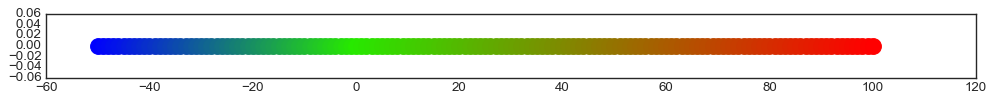

In [5]:
n          = 100
color_min  = "#0000FF" # blue
color_zero = "#27E900" # green
color_max  = "#FF0000" # red
plt.figure( figsize = (15, 1) )
for i in range(int(-n/2), n+1):
    plt.scatter(i, 0, s = 200, color = gpcr.color_fader( c1  = color_min,
                                                c2  = color_zero,
                                                c3  = color_max,
                                                mix = i / ((2 if i > 0 else 1)*n) + 0.5 ) )

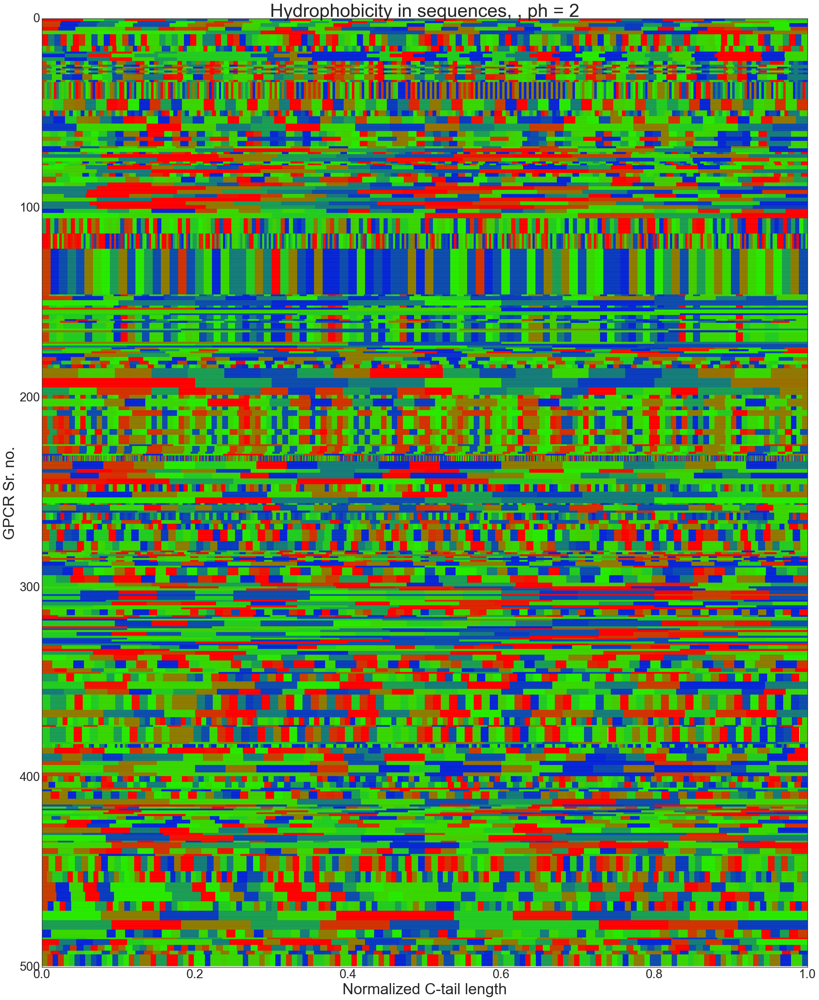

In [14]:
gpcr.line_hydrophobicity_in_sequences( sequences    = gpcr.DISPROT_DF[0:500]["seq"],
                                       scale_factor = 0.45,
                                       figsize      = (30, 36),
                                       # normalized   = False,
                                       linewidth    = 5,
                                       color_min    = color_min,  # blue
                                       color_zero   = color_zero, # green
                                       color_max    = color_max,  # red
                                       title_add    = ", ph = 2"
                                     ) 

C:\Users\Shashank\anaconda3\lib\site-packages\numpy\core\_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


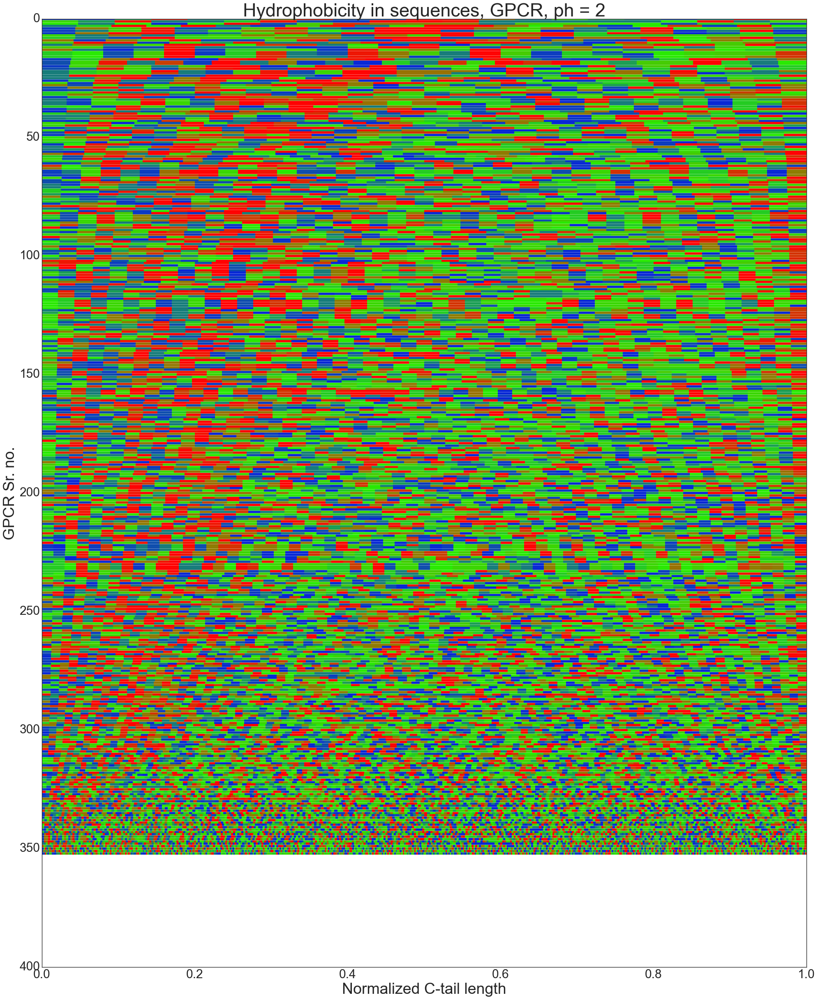

In [12]:
gpcr.line_hydrophobicity_in_sequences( # sequences    = gpcr.GPCR_DF[0:20]["seq"],
                                       scale_factor = 0.45,
                                       figsize      = (30, 36),
                                       # normalized   = False,
                                       linewidth    = 5,
                                       color_min    = color_min,  # blue
                                       color_zero   = color_zero, # green
                                       color_max    = color_max,  # red
                                       title_add    = ", ph = 2"
                                     ) 

C:\Users\Shashank\anaconda3\lib\site-packages\numpy\core\_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


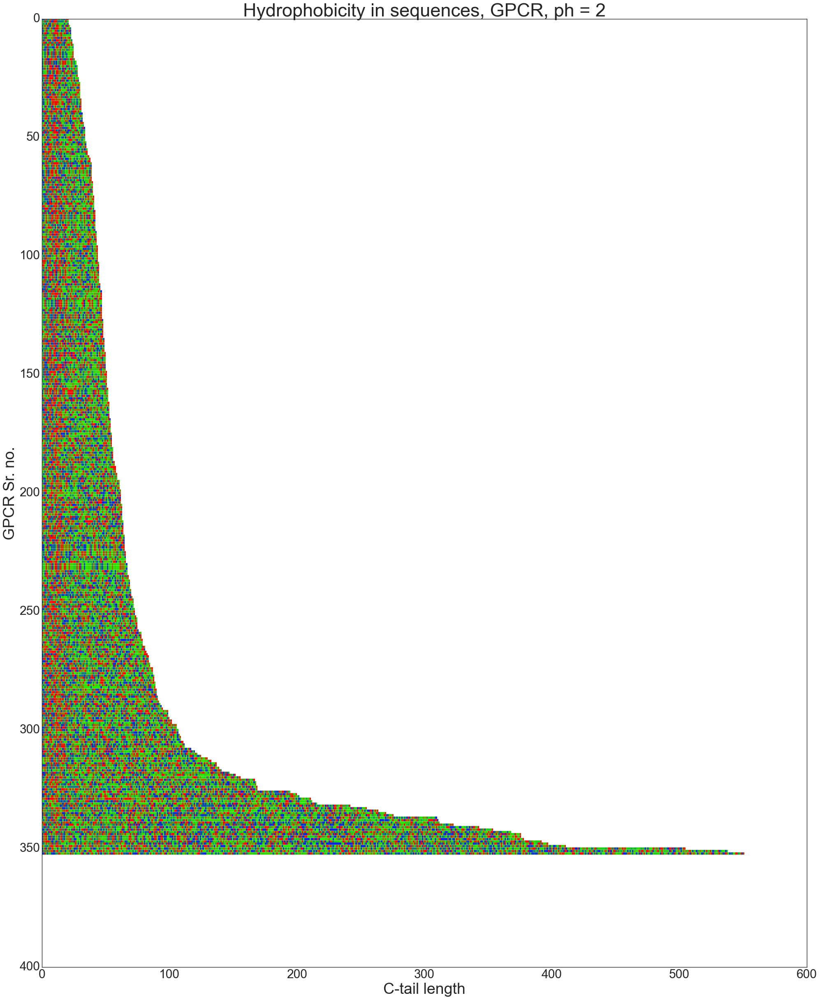

In [9]:
gpcr.line_hydrophobicity_in_sequences( # sequences    = gpcr.GPCR_DF[0:20]["seq"],
                                       scale_factor = 0.45,
                                       figsize      = (30, 36),
                                       normalized   = False,
                                       linewidth    = 5,
                                       color_min    = color_min,  # blue
                                       color_zero   = color_zero, # green
                                       color_max    = color_max,  # red
                                       title_add    = ", ph = 2"
                                     )

# <span style="color:orange"> Hydrophobicity at ph = 7 </span>

In [8]:
gpcr.AA.AA_HYDRO_PHOBICITY_PH7

{'R': -14,
 'K': -23,
 'H': 8,
 'D': -55,
 'E': -31,
 'N': -28,
 'Q': -31,
 'C': 49,
 'S': -5,
 'T': 13,
 'Y': 63,
 'G': 0,
 'A': 41,
 'P': -46,
 'V': 76,
 'L': 97,
 'I': 99,
 'M': 74,
 'W': 97,
 'F': 100}

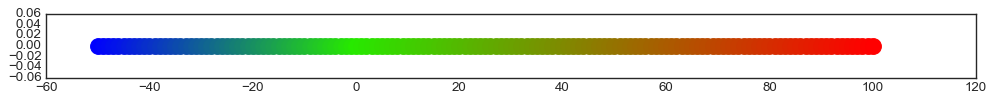

In [9]:
plt.figure( figsize = (15, 1) )
for i in range(int(-n/2), n+1):
    plt.scatter(i, 0, s = 200, color = gpcr.color_fader( c1  = color_min,
                                                c2  = color_zero,
                                                c3  = color_max,
                                                mix = i / ((2 if i > 0 else 1)*n) + 0.5 ) )

C:\Users\Shashank\anaconda3\lib\site-packages\numpy\core\_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


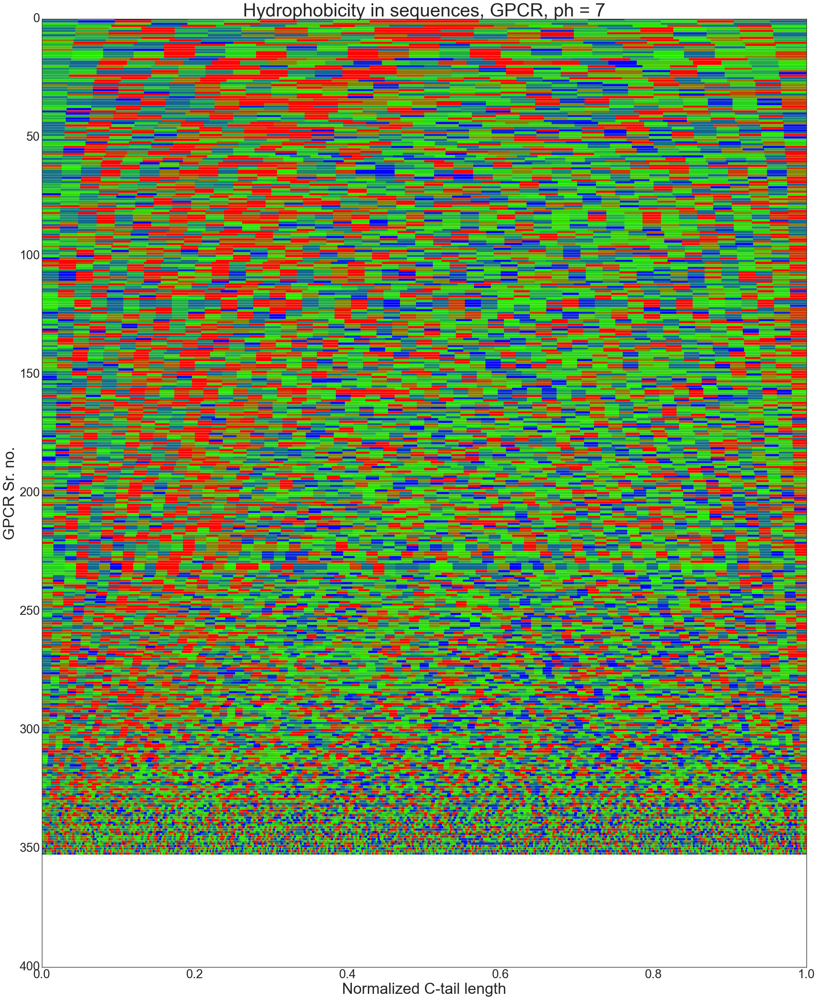

In [10]:
gpcr.line_hydrophobicity_in_sequences( # sequences    = gpcr.GPCR_DF[0:20]["seq"],
                                       hydrophobicity_aas = gpcr.AA.AA_HYDRO_PHOBICITY_PH7,
                                       scale_factor = 0.45,
                                       figsize      = (30, 36),
                                       # normalized   = False,
                                       linewidth    = 5,
                                       color_min    = color_min,  # blue
                                       color_zero   = color_zero, # green
                                       color_max    = color_max,  # red
                                       title_add    = ", ph = 7"
                                     )

C:\Users\Shashank\anaconda3\lib\site-packages\numpy\core\_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


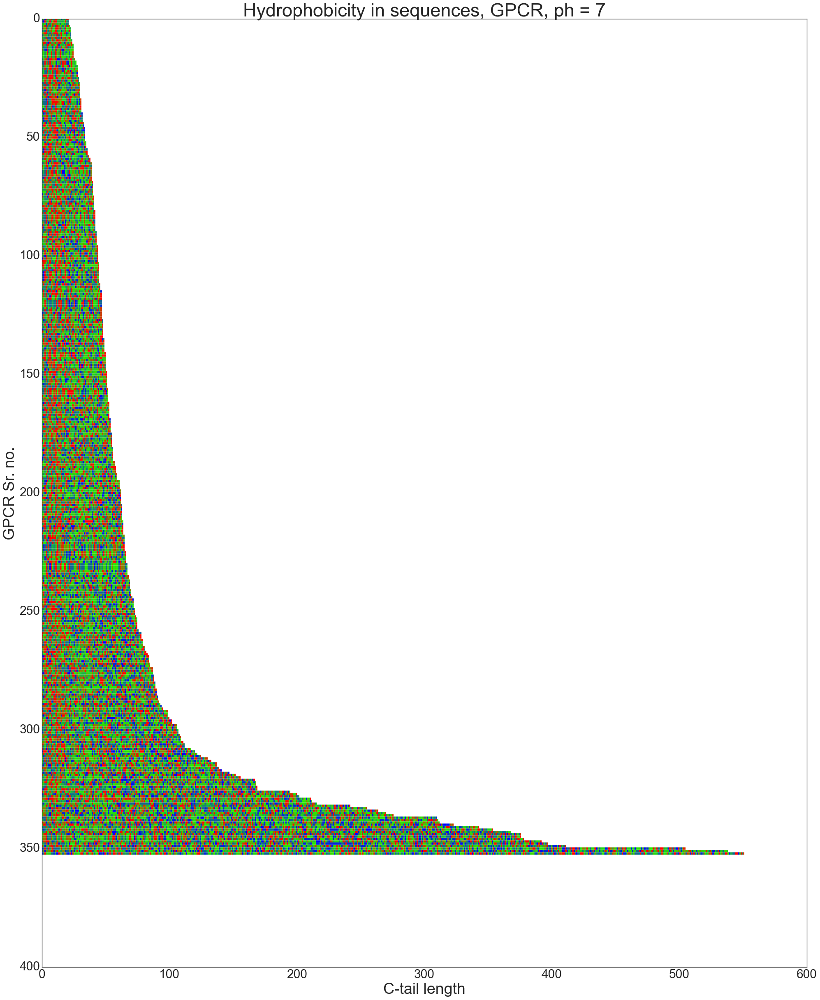

In [11]:
gpcr.line_hydrophobicity_in_sequences( # sequences    = gpcr.GPCR_DF[0:20]["seq"],
                                       hydrophobicity_aas = gpcr.AA.AA_HYDRO_PHOBICITY_PH7,
                                       scale_factor = 0.45,
                                       figsize      = (30, 36),
                                       normalized   = False,
                                       linewidth    = 5,
                                       color_min    = color_min,  # blue
                                       color_zero   = color_zero, # green
                                       color_max    = color_max,  # red
                                       title_add    = ", ph = 7"
                                     )

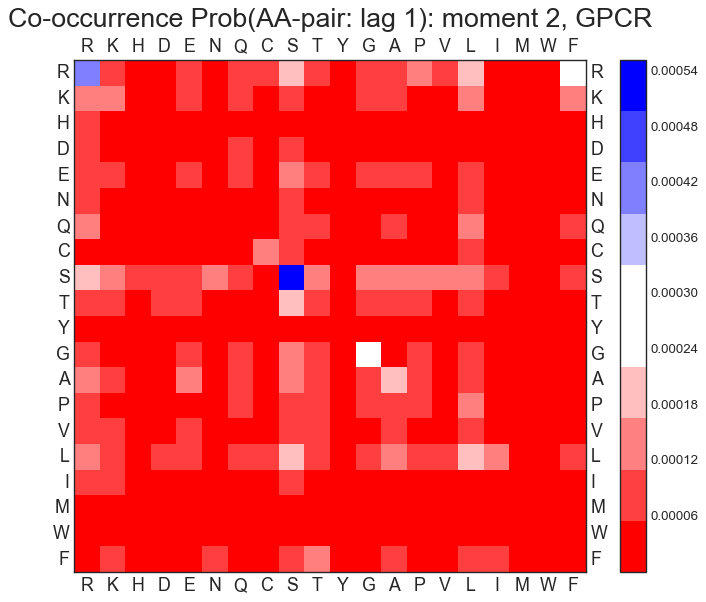

2.170821189880371
0.020515152842269003


In [43]:
start = time.time()
fig, fig_list, df, df_list = gpcr.heatmap_2 ( # df  = gpcr.GPCR_DF,
                                   join_sequences = False,
                                   lag            = 1,
                                   moment         = 2,
                                   # savefig        = True,
                                   figsize        = (11,8),
                                   cmap           = newcmp # "gist_rainbow", # gpcr.COLOR_COLORBAR_CMAP_RED_BLUE
                                 )
print( time.time() - start )
if df is not None: print( sum( df.sum() ) )

In [3]:
# lst[0]

100% |########################################################################|


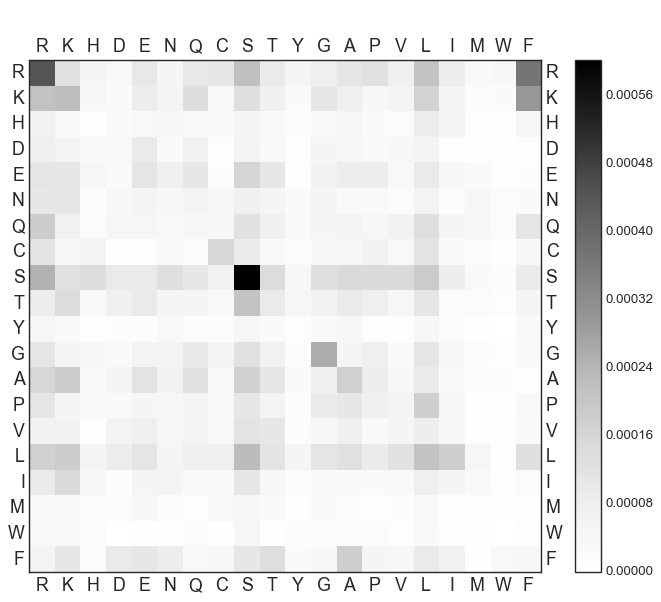

84.81468892097473
0.024838162880915223


In [5]:
start = time.time()
fig, fig_list, df, df_list = gpcr.heatmap_2 ( # df  = gpcr.GPCR_DF,
                                   join_sequences = False,
                                   lag            = 1,
                                   moment         = 2,
                                   # savefig        = True,
                                   figsize        = (11,8)
                                 )
print( time.time() - start )
if df is not None: print( sum( df.sum() ) )

In [ ]:
start = time.time()
fig, fig_list, df, df_list = gpcr.heatmap_2 ( # df  = gpcr.GPCR_DF,
                                   join_sequences = False,
                                   lag            = 1,
                                   moment         = 3,
                                   # savefig        = True,
                                   figsize        = (11,8)
                                 )
print( time.time() - start )
if df is not None: print( sum( df.sum() ) )

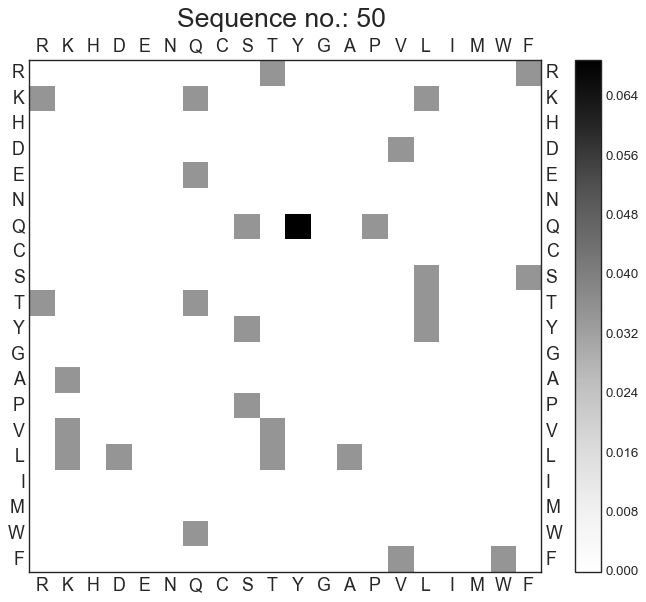

In [7]:
fig_list[50]

100% |########################################################################|


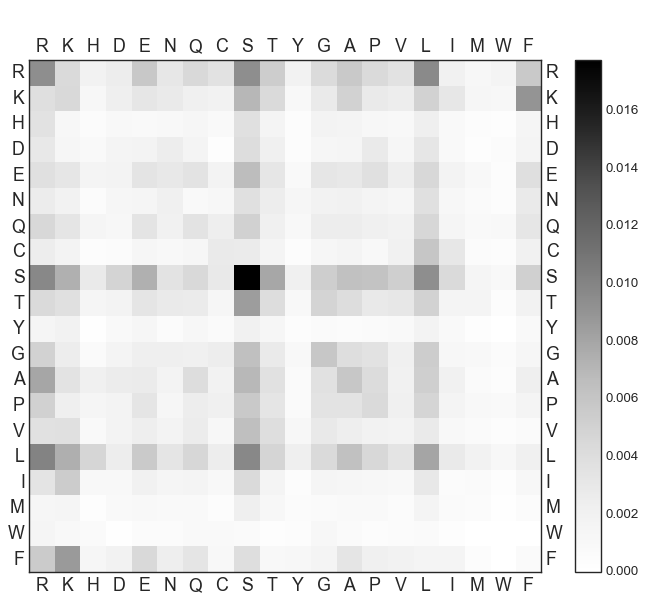

84.80066967010498
0.9999999999999999


In [8]:
start = time.time()
fig, fig_list, df, df_list = gpcr.heatmap_2 ( # df  = gpcr.GPCR_DF,
                                   join_sequences = False,
                                   lag            = 2,
                                   moment         = 1,
                                   # savefig        = True,
                                   figsize        = (11,8)
                                 )
print( time.time() - start )
if df is not None: print( sum( df.sum() ) )

In [29]:
len(df)

371

In [28]:
df = gpcr.GPCR_DF
df[ df["seq_len"] < 20 ].describe()


,seq_len
count,18.000000
mean,15.944444
std,2.312936
min,12.000000
25%,14.250000
50%,16.500000
75%,17.000000
max,19.000000


Std Err: 0.30514551491155806


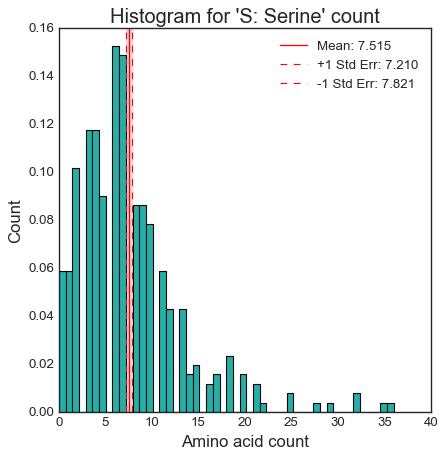

In [20]:
fig = gpcr.hist_proteins_residue_relative_count(residue        = "S",
                                                relative_count = False,
                                                threshold_     = 300,
                                               )

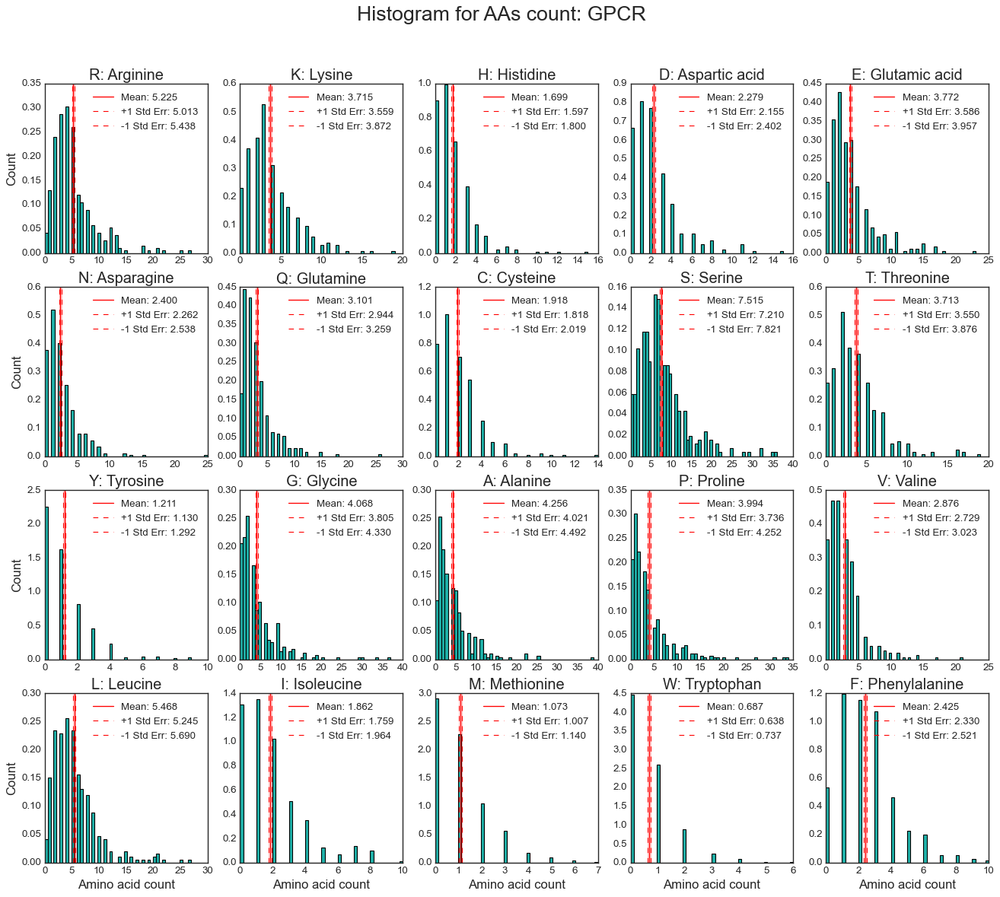

In [14]:
fig = gpcr.grid_hist_proteins_residue_relative_count( relative_count = False,
                                                sharex         = False,
                                                sharey         = False,
                                              )

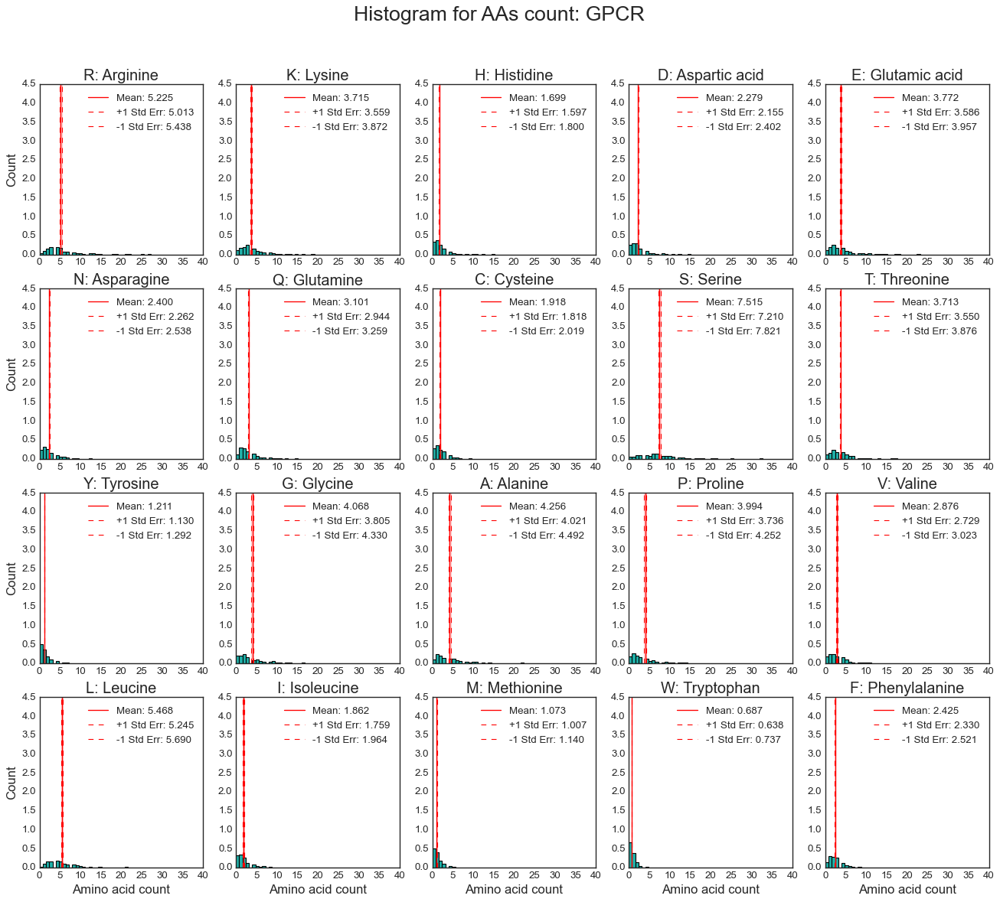

(<Figure size 1600x1280 with 20 Axes>,
 array([5.22535211, 3.71549296, 1.69859155, 2.27887324, 3.77183099,
        2.4       , 3.10140845, 1.91830986, 7.51549296, 3.71267606,
        1.21126761, 4.06760563, 4.25633803, 3.9943662 , 2.87605634,
        5.46760563, 1.86197183, 1.07323944, 0.68732394, 2.42535211]),
 array([5.01316684, 3.55859724, 1.59746717, 2.15533384, 3.58646007,
        2.2620811 , 2.94375382, 1.81774092, 7.21034744, 3.54952194,
        1.1304488 , 3.80546155, 4.02093416, 3.73625457, 2.72864472,
        5.24511718, 1.75946461, 1.00693172, 0.63770385, 2.32962836]),
 array([5.43753738, 3.87238867, 1.79971593, 2.40241264, 3.9572019 ,
        2.5379189 , 3.25906308, 2.0188788 , 7.82063847, 3.87583017,
        1.29208641, 4.32974972, 4.4917419 , 4.25247783, 3.02346795,
        5.69009408, 1.96447905, 1.13954715, 0.73694404, 2.52107587]))

In [13]:
gpcr.grid_hist_proteins_residue_relative_count( relative_count = False,
                                                sharex         = False,
                                                sharey         = False,
                                                xlim           = (0, 40),
                                                ylim           = (0, 4.5),
                                              )

100% |########################################################################|


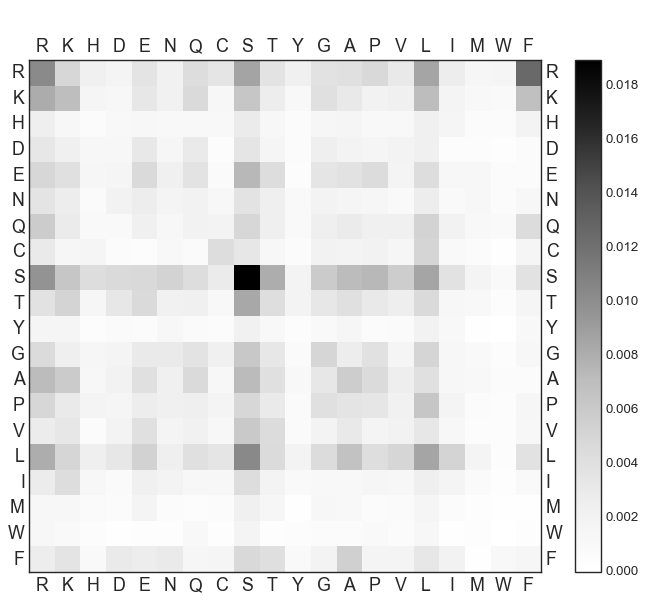

179.39191055297852
1.0


In [4]:
start = time.time()
fig, fig_list, df, df_list = gpcr.heatmap_2 ( # df  = gpcr.GPCR_DF,
                                   join_sequences = False,
                                   lag            = 1,
                                   moment         = 1,
                                   savefig        = True,
                                   figsize        = (11,8)
                                 )
print( time.time() - start )
if df is not None: print( sum( df.sum() ) )

In [ ]:
start = time.time()
fig, df, dct, lst = gpcr.heatmap_2 ( # df  = gpcr.GPCR_DF,
                                   sequences=uences      = gpcr.GPCR_DF[0:5],
                                   join_sequences = False,
                                   lag            = 1,
                                   moment         = 1,
                                   savefig        = True,
                                   figsize        = (11,8)
                                 )
print( time.time() - start )
if df is not None: print( sum( df.sum() ) )

In [ ]:
_, df, dct, lst = gpcr.heatmap_2 ( # df  = gpcr.GPCR_DF,
                                   join_sequences = False,
                                   lag            = 1,
                                   moment         = 1
                                 ) 
if df is not None: print( sum( df.sum() ) )

In [ ]:
_, df, dct, lst = gpcr.heatmap_2 ( # df  = gpcr.GPCR_DF,
                                   join_sequences = False,
                                   lag            = 1,
                                   moment         = 1.5
                                 ) 
if df is not None: print( sum( df.sum() ) )

In [ ]:
_, df, dct, lst = gpcr.heatmap_2 ( # df  = gpcr.GPCR_DF,
                                   join_sequences = False,
                                   lag            = 1,
                                   moment         = 2
                                 ) 
if df is not None: print( sum( df.sum() ) )

LPEETMDFMVQHTSFKEMKKNPMTNYTTVPQELMDHSISPFMRKGM


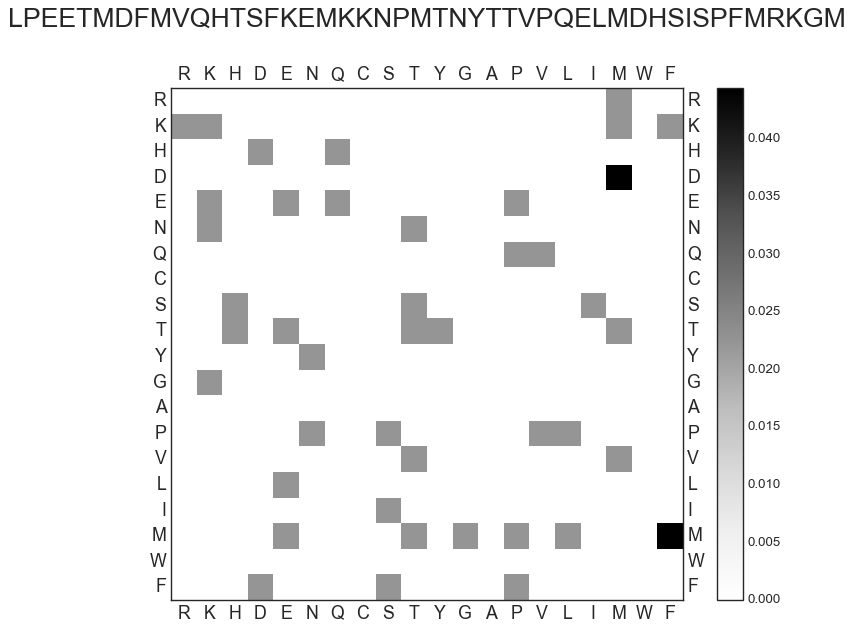

1.0


In [14]:
seq = gpcr.DISPROT_DF["seq"][5]
print( seq )
_, df, dct, lst = gpcr.heatmap_2 ( # df  = gpcr.GPCR_DF,
                                   sequences      = [seq],
                                   join_sequences = False,
                                   lag            = 1,
                                   moment         = 1,
                                   title          = seq + "\n"
                                 ) 
if df is not None: print( sum( df.sum() ) )

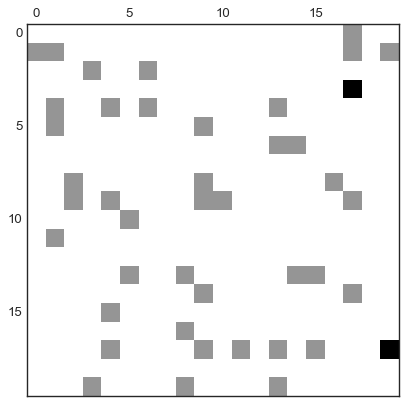

In [10]:
sqrt_df = np.sqrt(df)
plt.matshow(df)

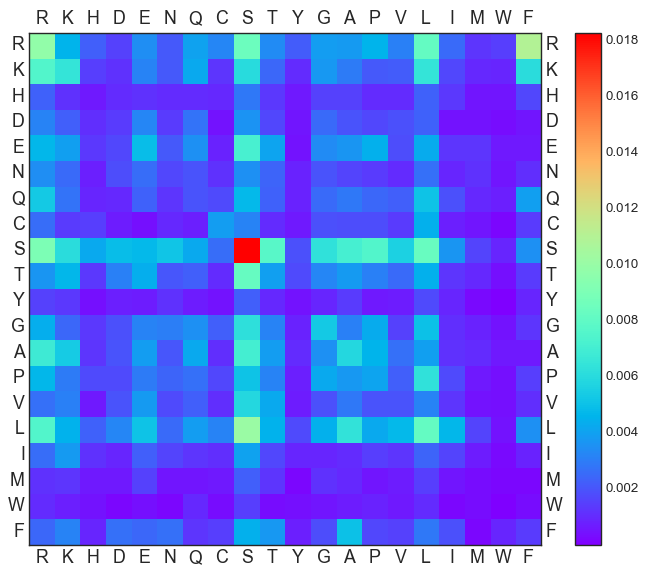

In [9]:
fig, df, dct, lst = gpcr.heatmap_( sequences = gpcr.GPCR_DF["seq"],
                                   title     = "",
                                   cmap      = "rainbow",
                                 )

In [18]:
import sys
from PIL import Image

images = [Image.open(x) for x in ['output/temp2/0.png','output/temp2/0.png','output/temp2/0.png']]
widths, heights = zip(*(i.size for i in images))

total_width = sum(widths)
max_height = max(heights)

new_im = Image.new('RGB', (total_width, max_height))

x_offset = 0
for im in images:
  new_im.paste(im, (x_offset,0))
  x_offset += im.size[0]

new_im.save('output/temp2/test.png')

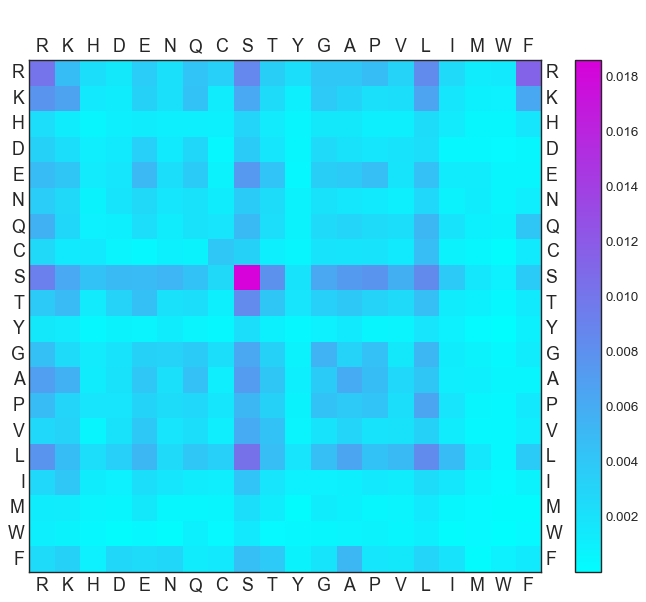

In [37]:
fig, df, dct, lst = gpcr.heatmap_( sequences = gpcr.GPCR_DF["seq"],
                                   title     = "",
                                   # cmap      = "rainbow",
                                 )

In [18]:
sequences = gpcr.GPCR_DF["seq"]
sum( [ len(seq) for seq in sequences ] )

28702

In [19]:
sum( gpcr.GPCR_DF["seq_len"] )

28702

In [36]:
sum(sum(lst))

0.9999999999999998

In [51]:
len_already = gpcr.DISPROT_DF["seq_len"]
sum(len_already)

270769

In [ ]:
sum(all lengths) - (count_of_seq * lag)

In [14]:
df

,R,K,H,D,E,N,Q,C,S,T,Y,G,A,P,V,L,I,M,W,F
R,0.010088,0.004701,0.002305,0.001604,0.003565,0.002130,0.004137,0.003338,0.008635,0.003478,0.002246,0.003951,0.003945,0.004690,0.003182,0.008357,0.002584,0.001284,0.001489,0.011319
K,0.007730,0.006658,0.001538,0.001237,0.003236,0.002155,0.004375,0.001318,0.006219,0.002530,0.001051,0.003822,0.003070,0.002182,0.002205,0.006629,0.001718,0.001015,0.000920,0.006302
H,0.002390,0.001201,0.000634,0.001035,0.001207,0.001093,0.001091,0.000970,0.002947,0.001345,0.000625,0.001566,0.001567,0.001082,0.001092,0.002430,0.001384,0.000576,0.000539,0.001732
D,0.003250,0.002319,0.001133,0.001419,0.003347,0.001447,0.002830,0.000511,0.003689,0.001705,0.000582,0.002598,0.001981,0.001753,0.001911,0.002408,0.000491,0.000513,0.000362,0.000537
E,0.004798,0.004035,0.001385,0.001697,0.004968,0.002216,0.003621,0.000863,0.007316,0.004216,0.000450,0.003482,0.003774,0.004560,0.001856,0.004391,0.001313,0.001267,0.000615,0.000649
N,0.003544,0.002647,0.000806,0.001891,0.002661,0.001738,0.002022,0.001236,0.003648,0.002457,0.000852,0.001990,0.001679,0.001434,0.001048,0.002757,0.000883,0.001232,0.000597,0.001175
Q,0.005476,0.002794,0.000931,0.001033,0.002345,0.001299,0.002028,0.001785,0.004899,0.002384,0.000872,0.002608,0.002960,0.002527,0.002326,0.005253,0.001940,0.000985,0.000785,0.004088
C,0.002676,0.001432,0.001512,0.000673,0.000444,0.001017,0.000784,0.003992,0.003239,0.001094,0.000629,0.001915,0.001851,0.001920,0.001430,0.004621,0.000813,0.000556,0.000169,0.001445
S,0.009254,0.006272,0.004373,0.004958,0.004828,0.005282,0.004380,0.002669,0.018660,0.007886,0.001912,0.006407,0.007274,0.007665,0.005712,0.008478,0.003778,0.001661,0.000916,0.003627
T,0.003754,0.004843,0.001333,0.003183,0.004507,0.002059,0.002291,0.001070,0.008413,0.004083,0.001813,0.003344,0.003886,0.003192,0.002602,0.004586,0.001262,0.001022,0.000412,0.001461


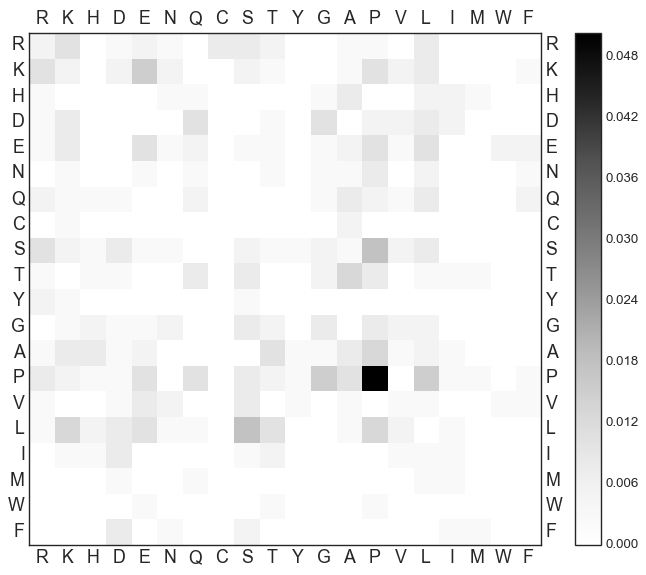

In [15]:
sequences = [ gpcr.GPCR_DF.iloc[366, 4] ]
# sequences = gpcr.GPCR_DF["seq"]
fig = gpcr.heatmap_(sequences = sequences)

In [8]:
fig

,R,K,H,D,E,N,Q,C,S,T,Y,G,A,P,V,L,I,M,W,F
R,0.009863,0.004599,0.002257,0.001573,0.003489,0.002085,0.004055,0.003235,0.008449,0.003390,0.002198,0.003886,0.003864,0.004605,0.003114,0.008174,0.002515,0.001258,0.001454,0.010992
K,0.007523,0.006470,0.001504,0.001217,0.003164,0.002107,0.004254,0.001287,0.006084,0.002471,0.001030,0.003737,0.003009,0.002143,0.002165,0.006456,0.001673,0.000997,0.000902,0.006092
H,0.002339,0.001174,0.000626,0.001015,0.001177,0.001059,0.001066,0.000950,0.002897,0.001322,0.000612,0.001540,0.001526,0.001062,0.001076,0.002355,0.001339,0.000567,0.000529,0.001689
D,0.003184,0.002272,0.001108,0.001396,0.003262,0.001422,0.002764,0.000501,0.003632,0.001677,0.000573,0.002554,0.001944,0.001724,0.001878,0.002358,0.000482,0.000506,0.000356,0.000529
E,0.004700,0.003949,0.001347,0.001668,0.004879,0.002154,0.003538,0.000849,0.007169,0.004121,0.000443,0.003420,0.003704,0.004478,0.001826,0.004314,0.001278,0.001245,0.000605,0.000638
N,0.003448,0.002576,0.000791,0.001859,0.002610,0.001701,0.001981,0.001201,0.003575,0.002410,0.000831,0.001953,0.001653,0.001413,0.001033,0.002703,0.000869,0.001201,0.000579,0.001152
Q,0.005338,0.002731,0.000912,0.000993,0.002306,0.001270,0.001995,0.001749,0.004786,0.002329,0.000856,0.002563,0.002907,0.002486,0.002269,0.005153,0.001896,0.000951,0.000768,0.003986
C,0.002593,0.001395,0.001459,0.000662,0.000438,0.000991,0.000771,0.003904,0.003168,0.001068,0.000617,0.001875,0.001810,0.001866,0.001400,0.004508,0.000794,0.000543,0.000167,0.001407
S,0.009046,0.006152,0.004261,0.004875,0.004745,0.005172,0.004289,0.002605,0.018303,0.007744,0.001881,0.006302,0.007131,0.007530,0.005602,0.008311,0.003703,0.001633,0.000899,0.003548
T,0.003671,0.004717,0.001303,0.003121,0.004417,0.002016,0.002244,0.001046,0.008238,0.004001,0.001774,0.003288,0.003809,0.003140,0.002556,0.004482,0.001244,0.001003,0.000402,0.001417


In [9]:
a = [0] * 2
a[0] = np.array( [ [1,2,3], [1,2,3] ] )
a[1] = np.array( [ [4,5,6], [4,5,6] ] )
np.mean(a, 0)
# len(a)

array([[2.5, 3.5, 4.5],
       [2.5, 3.5, 4.5]])

In [15]:
df["R"]x

R    0.010088
K    0.007730
H    0.002390
D    0.003250
E    0.004798
N    0.003544
Q    0.005476
C    0.002676
S    0.009254
T    0.003754
Y    0.001612
G    0.004470
A    0.006986
P    0.004778
V    0.002714
L    0.007718
I    0.002729
M    0.001211
W    0.001092
F    0.002495
Name: R, dtype: float64

In [16]:
dct["R"]

array([0.01008752, 0.00772974, 0.00238996, 0.0032503 , 0.00479841,
       0.00354415, 0.00547643, 0.00267627, 0.00925395, 0.00375365,
       0.00161249, 0.00447007, 0.00698556, 0.00477827, 0.00271377,
       0.00771847, 0.00272893, 0.00121125, 0.00109229, 0.00249546])

In [17]:
lst[0]

array([0.01008752, 0.00772974, 0.00238996, 0.0032503 , 0.00479841,
       0.00354415, 0.00547643, 0.00267627, 0.00925395, 0.00375365,
       0.00161249, 0.00447007, 0.00698556, 0.00477827, 0.00271377,
       0.00771847, 0.00272893, 0.00121125, 0.00109229, 0.00249546])

In [10]:
a = [0] * 2
a[0] = np.array( [ [ [1,2,3], [1,2,3] ], [ [1,2,3], [1,2,3] ], [ [1,2,3], [1,2,3] ] ] )
a[1] = np.array( [ [ [4,5,6], [4,5,6] ], [ [4,5,6], [4,5,6] ], [ [4,5,6], [4,5,6] ] ] )
# sum(a)
len(a)

2

In [1]:
def count_overlap(  seq   = None,
                    char_start = None,
                    char_next  = None,
                    lag   = 1 ):
    count = 0
    for i in range(len(seq) - lag):
        if seq[i] == char_start and seq[i + lag] == char_next:
            count += 1
    return count

In [ ]:
seq = "AXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXAAXXXA"
print( len(seq) )
for i in range(100000):
    print( count_overlap(  seq = seq,
                char_start = "A",
                char_next  = "A" ,
                lag        = 4
             ) )

3960
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792

792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792


792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792


792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792


792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792


792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792


792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792


792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792


792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792


792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792
792


In [21]:
"shsashasnk".count("sa")

0

In [22]:
charseq = 'abbcccdddd'
distros = { c:1 for c in charseq  }

for c in range(len(charseq)-1):
    if charseq[c] == charseq[c+1]:
        distros[charseq[c]] += 1

print(distros)

{'a': 1, 'b': 2, 'c': 3, 'd': 4}


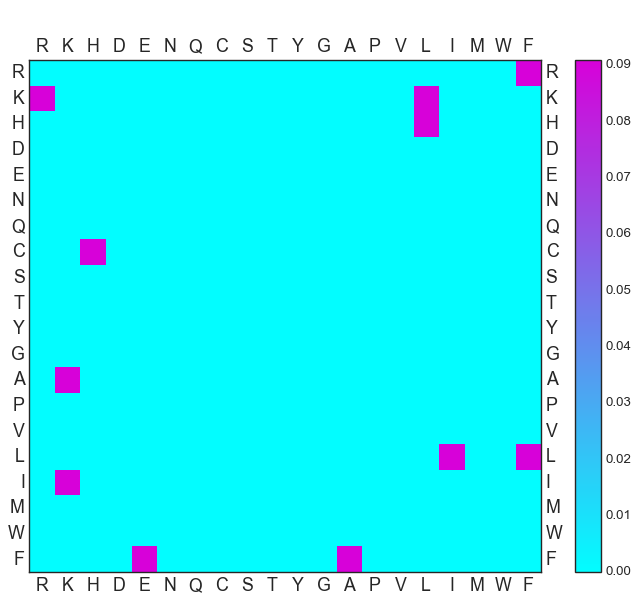

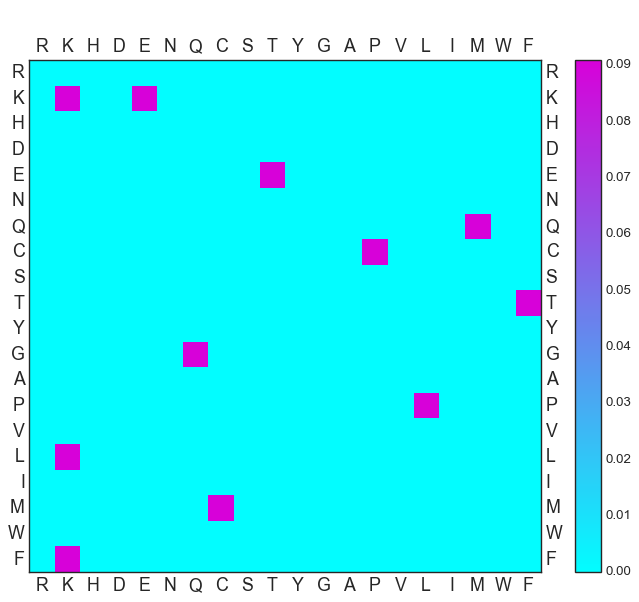

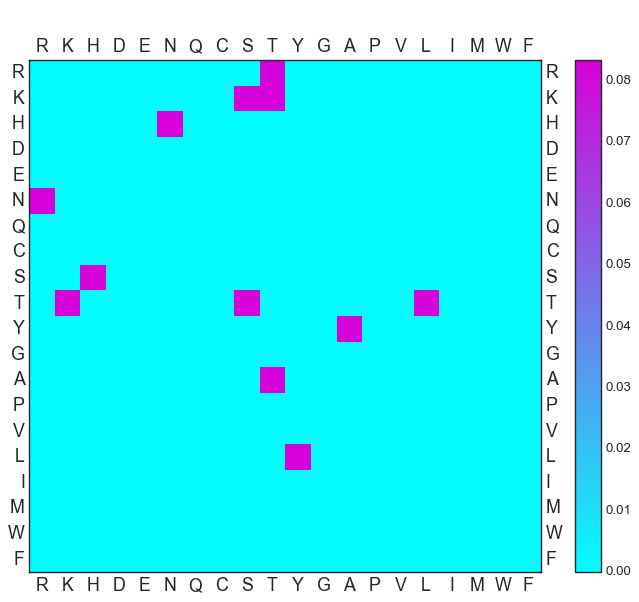

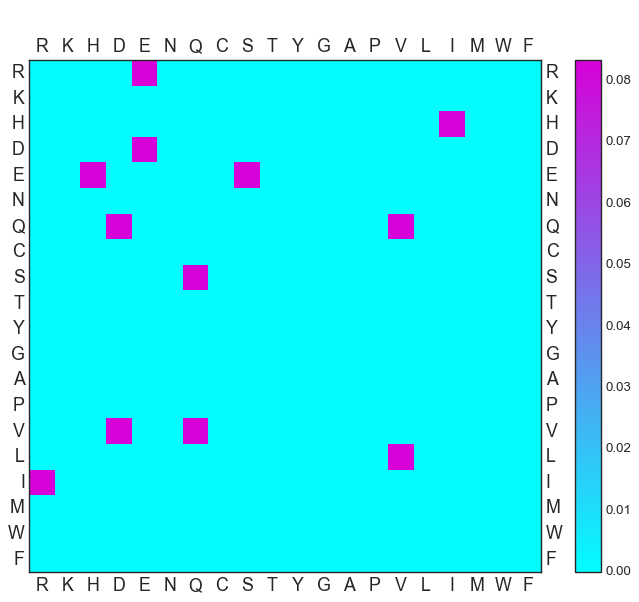

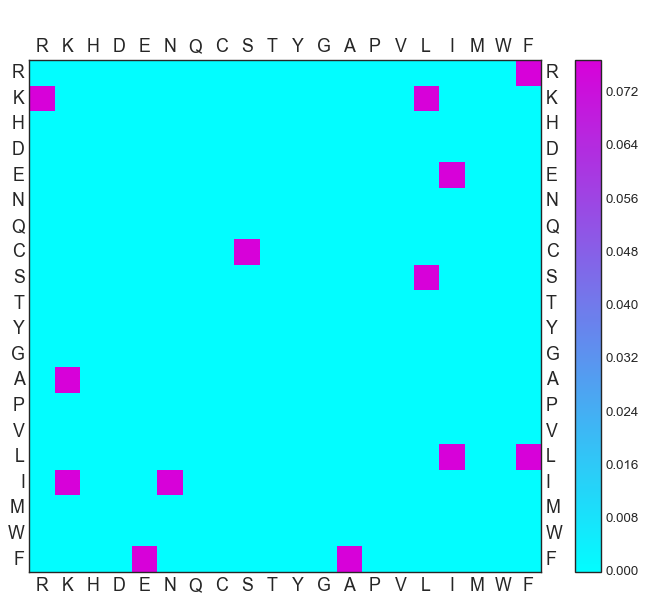

...

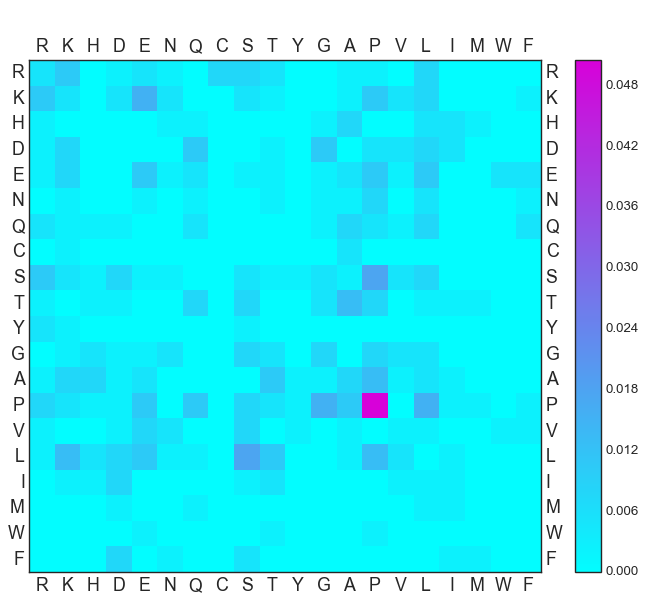

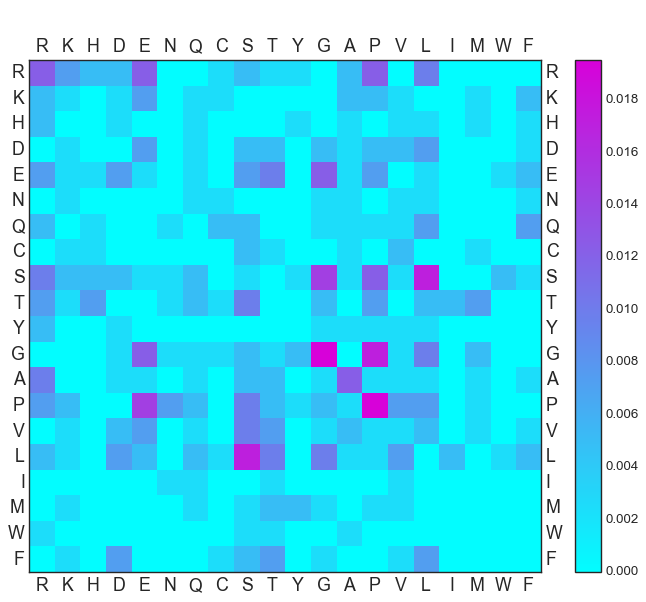

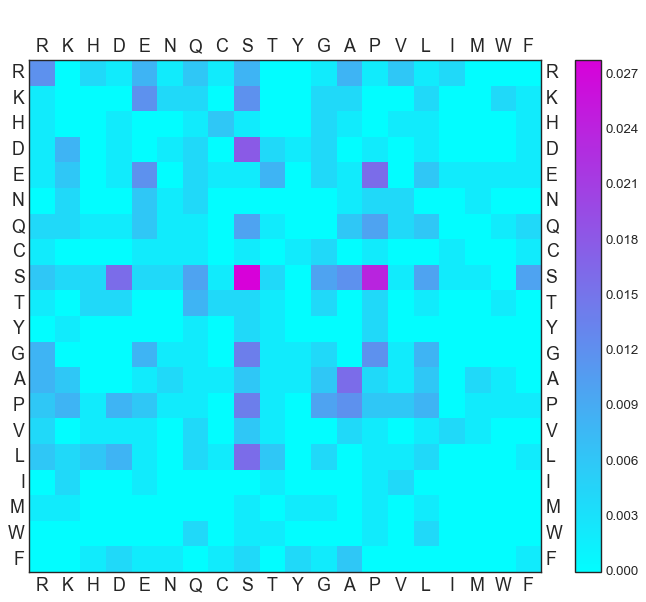

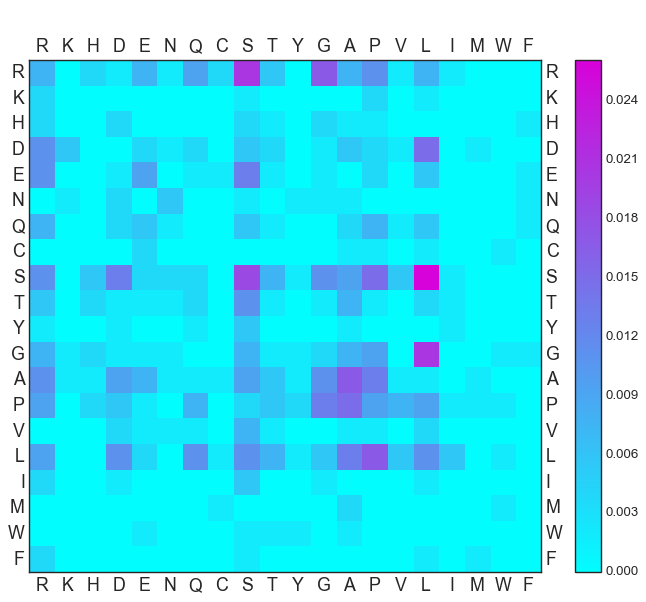

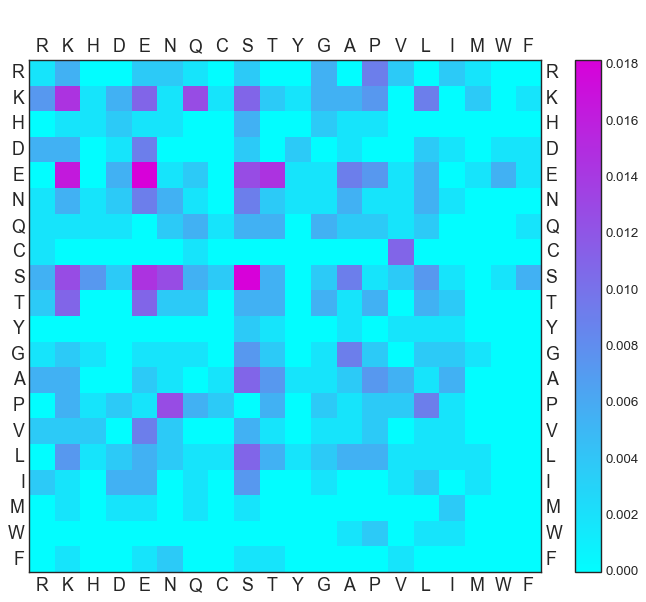

In [7]:
# sequences = [ gpcr.GPCR_DF.iloc[1, 4] ]
sequences = gpcr.GPCR_DF["seq"]
for seq in sequences:
    fig = gpcr.heatmap_(sequences = [seq])